# PyData Global 2021 - Introduction to Distance Metric learning

Hello, and welcome to this tutorial session, which was a part of the [PyData Global 2021](https://pydata.org/global2021/schedule/presentation/108/introduction-to-distance-metric-learning/) conference. This notebook will guide you through the topic of metric learning, a sub-field of **supervised learning** & **representation learning**, which aims to learn a meaningful quantifiable measurement for similarity ("metric" or "distance") in the supervised task domain.

Metric learning is a very useful field in computer vision, recommendation systems, as well as for diemnionality reduction (compression or visualization).

The intuitiveness behind why metric learning is useful lies in distance-based algorithms (i.e. k-nearest neighbors or k-means). If you have a good measurement for similarity (or distance) - many problems in AI and machine learning become trivial.
* If you have a good way to find similarity in faces, you could build an excellent face verification model with a simple distance measurement with a threshold.
* If you have a good way to find similarity in music or movies that an individual likes, you can easily recommend this person the next content to consume by looking at the nearest neighbors (where similar items are closer together).
* In a similar manner, you could apply clustering on the similar entities which are semantically close to both learn about interesting aspects of the similar items (k-means), and to classify new items based on proximity (k-nearest neighbors).

Let's get started.

# Understanding distances

## Background 
Merriam Webster [defines of a metric](https://www.merriam-webster.com/dictionary/metric), which includes the mathematical definition - a function between two elements that results in a real number measurement (i.e. $d: \mathbb{R}^n \times \mathbb{R}^n \rightarrow \mathbb{R}$) that satisfy the following conditions:

* **Coincidence**: $d(\vec{x}, \vec{y})=0 \iff \vec{x}=\vec{y}$, for every $\vec{x},\vec{y}\in \mathbb{R}^n$

* **Symmetry**: $d(\vec{x}, \vec{y})=d(\vec{y}, \vec{x})$, for every $\vec{x},\vec{y}\in \mathbb{R}^n$

* **Triangle inequality**: $d(\vec{x},\vec{z}) \le d(\vec{x},\vec{y}) + d(\vec{y},\vec{z})$, for every $\vec{x},\vec{y},\vec{z} \in \mathbb{R}^n$

* **Non-negativity**: $d(\vec{x},\vec{y}) \ge 0$, for every $x,y\in \mathbb{R}^n$

A couple of very well-known and intuitive distances are the **Euclidean** (or *L2*) distance and the **Manhattan** (or *L1* or taxi-driver) distance.
* **Manhattan distance**: $d(\vec{x},\vec{y}) = \sum_{i=1}^n|x_i-y_i|$

* **Euclidean distance**: $d(\vec{x},\vec{y}) = \sqrt{\sum_{i=1}^n(x_i-y_i)^2} = \sqrt{(\vec{x}-\vec{y})^T(\vec{x}-\vec{y})}$


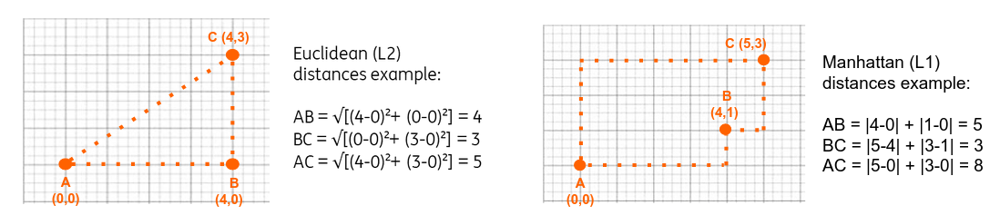

In scikit-learn, you can play around & evaluate some pairwise distance with some of these metrics in the namespace <code>sklearn.neighbors.DistanceMetric</code>.

In [ ]:
import numpy as np
from sklearn.neighbors import DistanceMetric

def calculate_triange_distances(a, b, c, metric_str: str, **metric_params):
  """For the points a,b,c and the metric & its parameters, we would compute 
     the distances between the 3 points. """
  print(f"Calculate [{metric_str} {metric_params}] distances.\nPoints: A={a}, B={b}, C={c}")
  metric = DistanceMetric.get_metric(metric_str, **metric_params)
  print("Distances: " +
    ", ".join(
      [f"d(A,B)={float(metric.pairwise(np.array([a]),np.array([b]))):0.2f}",
       f"d(B,C)={float(metric.pairwise(np.array([b]),np.array([c]))):0.2f}",
       f"d(A,C)={float(metric.pairwise(np.array([a]),np.array([c]))):0.2f}\n"]))

calculate_triange_distances(metric_str="euclidean", a=(0,0), b=(4,0), c=(4,3))
calculate_triange_distances(metric_str="manhattan", a=(0,0), b=(4,1), c=(5,3))

Calculate [euclidean {}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=5.00

Calculate [manhattan {}] distances.
Points: A=(0, 0), B=(4, 1), C=(5, 3)
Distances: d(A,B)=5.00, d(B,C)=3.00, d(A,C)=8.00



## Parameterized distances

The Euclidean and Manhattan distances are well known and simple distances, and there are many other distnaces which, depending on the domain (i.e. [$\chi^2$ distance](https://www.geeksforgeeks.org/chi-square-distance-in-python/) is useful histogram or image differences), could give a different, perhaps more fitting similarity estimation. These distances are also *non-parameterized* distances, meaning we didn't need to provide an additional parameter to evaluate the distance - only the elements.

There are other types of distances, *parameterized distances*, which require a parameter that adjusts the distance function.

Let's look at a simple parameterized distance, which generalizes both the Manhattan & Euclidean distance. It's called the **Minkowski distance**, and given a parameter $p\gt0$, the distance is defined as:

$d_p(\vec{x},\vec{y})=(\sum_{i=1}^n|x_i-y_i|^p)^{\frac{1}{p}}$

You can see that when $p=1$, the Minkowski distance becomes the Manhattan distance. And when $p=2$, the Minkowski distance become the Euclidean distance. But you could specify different values of $p$, and get different "unit of distance" (the set of points which are of a distance of 1 from the given point).

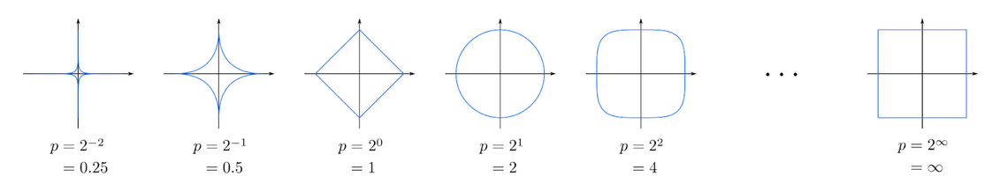

**Question 1**: The Minkowski distance is only a well defined metric when $p \ge 1$. Why is that?

<details><summary>Click to see the answer</summary>
<pre>For p<1 values, the Minkowski distance doesn't satisfy the triange inequality.

For example, for p=0.5, a=(0,0), b=(1,0), c=(1,1), the Minkowsky distances are:

d(a,c) = ((1-0) ** 0.5 + (1-0) ** 0.5) ** (1/0.5) = 4
d(b,c) = ((1-1) ** 0.5 + (1-0) ** 0.5) ** (1/0.5) = 1
d(a,b) = ((1-0) ** 0.5 + (0-0) ** 0.5) ** (1/0.5) = 1
</pre>
</details>

In [ ]:
calculate_triange_distances(metric_str="minkowski", a=(0,0), b=(4,0), c=(4,3), p=1)
calculate_triange_distances(metric_str="minkowski", a=(0,0), b=(4,0), c=(4,3), p=1.5)
calculate_triange_distances(metric_str="minkowski", a=(0,0), b=(4,0), c=(4,3), p=2)
calculate_triange_distances(metric_str="minkowski", a=(0,0), b=(4,0), c=(4,3), p=4)
calculate_triange_distances(metric_str="minkowski", a=(0,0), b=(4,0), c=(4,3), p=20)

Calculate [minkowski {'p': 1}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=7.00

Calculate [minkowski {'p': 1.5}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=5.58

Calculate [minkowski {'p': 2}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=5.00

Calculate [minkowski {'p': 4}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=4.28

Calculate [minkowski {'p': 20}] distances.
Points: A=(0, 0), B=(4, 0), C=(4, 3)
Distances: d(A,B)=4.00, d(B,C)=3.00, d(A,C)=4.00



There are lots of other parameterized distances with some very interesting ideas (see [Earth moving distance](https://en.wikipedia.org/wiki/Earth_mover%27s_distance) which is used in some developments measuring similarity in text & in vision), but the main advantage behind parameterized distances is that they gives us a chance to *learn what is the best set of parameters for a specific problem*, and in a sense, **learn the best metric for the problem** in a supervised manner.

Let's dive into another very useful parameterized distance - the **Mahalanobis distance**.

## Mahalanobis distance
The mahalanobis distance is one type of a parameterized distance. It was invented in 1936 by Prasanta Chantra Mahalanobis as a method to evaluate a distance of a point from a mean of a distribution, which was generalized to learning the distance between two points across a data distribution.

From a mathematical definition, it resembles the evaluation of 

* Euclidean distance: $d(\vec{x},\vec{y}) = \sqrt{(\vec{x}-\vec{y})^T(\vec{x}-\vec{y})}$.

* Mahalanobis distance: $d_M(\vec{x},\vec{y}) = \sqrt{(\vec{x}-\vec{y})^TM(\vec{x}-\vec{y})}$.

As it was used mainly to evaluate a distance of a datapoint from a distribution (and in that, to find outliers with larger distance), the choice of $M$ matrix was suggested to be the inverse of the covariance matrix of the data.

**Question 2**: There's another very famous dimensionality reduction technique which uses the inverse of the covariance matrix. Which technique is it?

<details><summary>Click to see the answer</summary>
<pre>Principle Component Analysis (PCA) uses the inverse of the covariance matrix, decomposing it with singular value decomposition.</pre>
</details>

In this following example, you could see an example on how the Mahalanobis distance with $M=cov(X)^{-1}$ is used to detect outliers. We're generating a dataset sampled from a 2-d normal distribution, and specify two points: an inlier (in black cross)

In [ ]:
# This code is used to draw the confidence ellipses of the data and is mainly taken
# from https://matplotlib.org/stable/gallery/statistics/confidence_ellipse.html

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """ Create a plot of the covariance confidence ellipse of *x* and *y*. """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

Euclidean distance between mu & inlier:   12.10
Euclidean distance between mu & outlier:   4.61
Mahalanobis distance between mu & inlier:  2.52
Mahalanobis distance between mu & outlier: 4.99


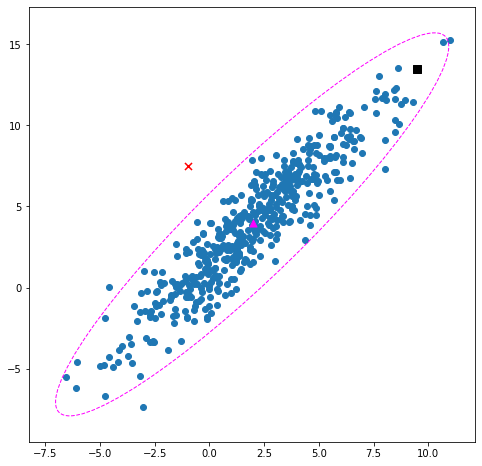

In [ ]:
# Mahalanobis distance example.

# Specifying the parameters for the new dataset.
n = 500                          # Number of points.
dependency = [[0.85, 0.45],      # Defines the dependency
              [-0.55, -0.65]]    # between the points.
mu = 2, 4                        # The mean of the distribution.
scale = 3, 5                     # The scale of the distribution.
outlier = np.array([-1, 7.5])    # Point outside 3 std. of the distribution.
inlier = np.array([9.5, 13.5])   # Point inside 3 std. of the distribution.

# Generating a correlated dataset.
np.random.seed(42)
def get_correlated_dataset(n, dependency, mu, scale):
    latent = np.random.randn(n, 2)
    dependent = latent.dot(dependency)
    return dependent * scale + mu
data = get_correlated_dataset(n, dependency, mu, scale)

# Draw the data distribution.
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(data[:,0], data[:,1])
plt.scatter(mu[0],      mu[1],      c="fuchsia", marker="^", s=50)

plt.scatter(outlier[0], outlier[1], c="red",    marker="x", s=50)
plt.scatter(inlier[0],  inlier[1],  c="black",  marker="s", s=50)
confidence_ellipse(data[:,0], data[:,1], ax=ax, n_std=3.0, 
                   edgecolor='fuchsia', linestyle='--')

# Define the Mahalanobis distance as a function of covariance matrix inverse.
M = np.linalg.inv(np.cov(data.T))
euclidean = DistanceMetric.get_metric("euclidean")
mahalanobis = DistanceMetric.get_metric("mahalanobis", VI=M)

# Compute Euclidean & Mahalanobis distances 
print("Euclidean distance between mu & inlier:   {:5.2f}".format(
      np.sqrt(np.dot((mu - inlier), (mu - inlier)))))
      #float(euclidean.pairwise([mu], [inlier]))))
print("Euclidean distance between mu & outlier:  {:5.2f}".format(
      np.sqrt(np.dot((mu - outlier), (mu - outlier)))))
      #float(euclidean.pairwise([mu], [outlier]))))
print("Mahalanobis distance between mu & inlier: {:5.2f}".format(
      np.sqrt(np.dot(np.dot((mu - inlier), M), (mu - inlier)))))
      #float(mahalanobis.pairwise([mu], [inlier]))))
print("Mahalanobis distance between mu & outlier:{:5.2f}".format(
      np.sqrt(np.dot(np.dot((mu - outlier), M), (mu - outlier)))))
      #float(mahalanobis.pairwise([mu], [outlier]))))

# From distances to transformations

## Finding alternatives for matrix $M$

So we've seen that using the inverse covariance matrix is great for finding distance within a distribution. But since the Mahalanobis distance is parameterized, we could try to find a specific $M\in\mathbb{R}^{n\times n}$ that helps us in our specific supervised task. But which other matrices could we use for $M$ instead of the inverse covariance matrix?

So looking into the definition of the Mahalanbois distance - we see that in order for the distance to be defined and non-negative, for every two data points $\vec{x},\vec{y}$, if we set $\vec{z}=\vec{x}-\vec{y}$, we get that: 
$d_M(\vec{x},\vec{y}) = \sqrt{\vec{z}^TM\vec{z}} \Rightarrow \vec{z}^TM\vec{z} \ge 0$.

The family of matrices that satisfy for every $\vec{z} \in \mathbb{R}^n$ that $\vec{z}^TM\vec{z} \ge 0$ is called **positive semidefinite (PSD) matrices**. Any PSD matrix (denoted as $M \succeq 0$) can serve as the parameter for the Mahalanobis distance (and indeed, the inverse covariance matrix $M=cov(X)^{-1}$ is a positive semidefinite matrix).


## How do we find new PSD matrices?

PSDs have some interesting characteristics which you can read about [here](http://theanalysisofdata.com/probability/C_4.html) or in page 51 in the [Matrix Cookbook](https://www.math.uwaterloo.ca/~hwolkowi/matrixcookbook.pdf). But for our topic, we will focus on one trait: a matrix $M$ is a PSD ($M\succeq 0$) if and only if there exists another matrix $L$ such that $L^TL=M$.

This leads us once again the definition of the Mahalanobis distance:

$d_M(\vec{x},\vec{y}) = \sqrt{(\vec{x}-\vec{y})^TM(\vec{x}-\vec{y})} = \sqrt{(\vec{x}-\vec{y})^TL^TL(\vec{x}-\vec{y})} = \sqrt{(L(\vec{x}-\vec{y}))^TL(\vec{x}-\vec{y})} = \sqrt{(L\vec{x}-L\vec{y})^T(L\vec{x}-L\vec{y})}$.

Now comes the coolest part in the entire notebook. If we evaluate that expression, we see that the **Mahalanobis distance between $\vec{x}$ and $\vec{y}$ parameterized by $M$** is actually equal to the **Euclidean distance between $L\vec{x}$ and $L\vec{y}$**, which are $\vec{x}$ and $\vec{y}$ in the transformed (latent) space after applying the the linear transformation defined by $L$.

And since every matrix $L$ could generate a PSD by $L^TL$, it's much easier to search and learn *a meaningful transformation $L$* such that the Euclidean distance is meaningful in the latent space, than it is to learn the Mahalanobis distance directly.

Or as Drake says:

![](https://drive.google.com/uc?export=view&id=1aybX_N9PR2tv_vEh3_TVIzj0rP7x7iMY)

## Example transformation: PCA Whitening

PCA uses the inverse covariance matrix to rotate the axes across their variance.
But when fitting a PCA transformation using <code>sklearn.decomposition.PCA</code>, you can specify <code>whiten=True</code>. [Whitening transformation](https://en.wikipedia.org/wiki/Whitening_transformation) not only rotates the axes, but also transforms the data into the latent space of the Mahalanobis distance parameterized by the inverse covariance matrix. 

Basically, the Euclidean distance in the new transformed space is the same as the Mahalanobis distance in the original space.

We could see this behavior using the same dummy dataset as before. This code shows the PCA transformation on our original dummy data - first the regular PCA, and then the whitening. We see that the Euclidean distance between the mean and the inlier / outlier doesn't change from the original space (PCA only rotates the axes on which the data lies), but the whitening transformation makes the Euclidean distance in the latent space equal to the Mahalanobis distance in the original space.


Euclidean distance in latent space PCA(whiten=False):
* Between mu & inlier:  12.10
* Between mu & outlier:  4.61
Euclidean distance in latent space PCA(whiten=True):
* Between mu & inlier:   2.52
* Between mu & outlier:  4.99


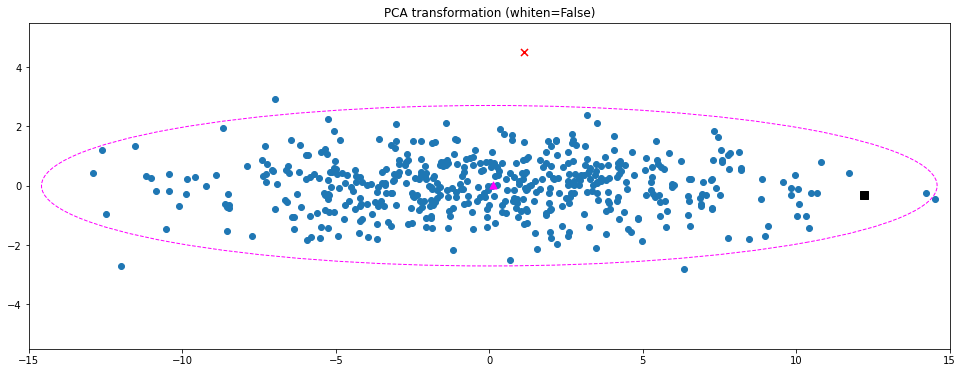

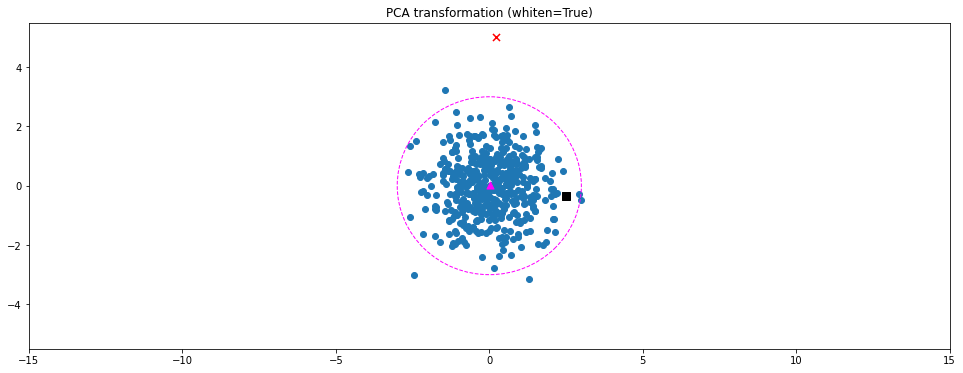

In [ ]:
from sklearn.decomposition import PCA

def draw_pca_data(data, mu, inlier, outlier, whiten):
  # Transforms the data to the latent space.
  pca = PCA(whiten=whiten).fit(data)
  latent_data = pca.transform(data)
  latent_mu = pca.transform([mu])[0]
  latent_outlier = pca.transform([outlier])[0]
  latent_inlier = pca.transform([inlier])[0]
  # Draw figure.
  fig, ax = plt.subplots(1, 1, figsize=(16.5, 6))
  plt.scatter(latent_data[:,0], latent_data[:,1])
  confidence_ellipse(latent_data[:,0], latent_data[:,1], ax=ax, 
                    n_std=3.0, edgecolor='fuchsia', linestyle='--')
  plt.scatter(latent_mu[0],      latent_mu[1],      c="fuchsia", marker="^", s=50)
  plt.scatter(latent_outlier[0], latent_outlier[1], c="red",    marker="x",  s=50)
  plt.scatter(latent_inlier[0],  latent_inlier[1],  c="black",  marker="s",  s=50)
  plt.title(f"PCA transformation (whiten={whiten})")
  plt.ylim([-5.5,5.5])
  plt.xlim([-15,15]);
  # Compute Euclidean distance in the latent space.
  print(f"Euclidean distance in latent space PCA(whiten={whiten}):")
  print("* Between mu & inlier:  {:5.2f}".format(
        np.sqrt(np.dot((latent_mu - latent_inlier), 
                      (latent_mu - latent_inlier)))))
  print("* Between mu & outlier: {:5.2f}".format(
        np.sqrt(np.dot((latent_mu - latent_outlier), 
                      (latent_mu - latent_outlier)))))
  
draw_pca_data(data=data, mu=mu, inlier=inlier, outlier=outlier, whiten=False)
draw_pca_data(data=data, mu=mu, inlier=inlier, outlier=outlier, whiten=True)


# Learning a transformation
In this section, I'll explain a bit what is required to learn a meaningful transformation to a latent space.

## Isn't it just manifold learning?
Both *manifold learning* and *metric learning* are subfields of representation-learning used to learn a transformation from the original feature space to a new latent space. The main difference is in the **supervision**: 
* Manifold learning discovers a transformation to lower dimensional space *without supervision*, often trying to preserve both local and global relationships that exists in the higher dimensional space. 
* Metric learning uses a provided supervision (i.e. an indication of similarity & dissimilarity between sets of data points) to learn a new representation, where the guidance provided is reflected.

So to make it easy: ***supervised = metric learning, unsupervised = manifold learning***.

If you're interested in manifold learning, you can find more information on:

* The [scikit-learn manifold learning page](https://scikit-learn.org/stable/modules/manifold.html) with the provided algorithms in the package.

* The Wikipedia page for [nonlinear dimensionality reduction](https://en.wikipedia.org/wiki/Nonlinear_dimensionality_reduction).
* Two very common non-linear manifold learning approaches today are [t-distributed Stochastic Neighborhood Embedding](https://towardsdatascience.com/t-sne-clearly-explained-d84c537f53a) (tSNE) and [Uniform Manifold Approximation and Projection](https://umap-learn.readthedocs.io/en/latest/how_umap_works.html) (UMAP). [This page](https://pair-code.github.io/understanding-umap/) and [this page](https://towardsdatascience.com/tsne-vs-umap-global-structure-4d8045acba17) both beautifully illustrate some of the differences between them.

## What kind of supervision is supported?

As opposed to classification or regression problems, where every instance during training is associated with some sort of label (either a class or a measurement), metric learning can have several types of supervision which are an indication of either: a similarity between instances, a dissimilarity between instances, or a combination of both.

As you read through literature and loss functions, you will see supervisions described as:
* **Tuples**: Usually comes in two sets (*positive* tuples and *negative* tuples), each set contains pairs of data points $(a,b)$ that are either an indication that $a$ is similar to $b$ (for *positive* tuples) or that $a$ is dissimilar to $b$ (for *negative* tuples).
* **Triplets**: A set where each element is an combination of three data points $(a, b, c)$ that indicate that $a$ is more similar to $b$ than it is to $c$, and therefore in the latent space $dist(a,b) < dist(a,c)$. 
* **Quadruples**: A set where each element is a combination of four data points $(a,b,c,d)$ that indicate that $a$ is more similar to $b$ than $c$ is similar to $d$, and therefore in the latent space $dist(a,b) < dist(c,d)$.

You can imagine how to translate a regular classification problem (with a class assigned to each point) to each of the setting described (i.e. each members of the same class needs to be similar to each other in the latent space, and dissimilar to other classes).

At the same time, it allows metric learning algorithms to take into account weaker supervision (i.e. a user liked movie $a$ more than movie $b$).

## Loss functions

In classification and regression problem loss functions are usually composed of a (often differential) transformation

A metric learning loss function combines three elements:
1. **The transformation function**: A differential transformation function $\phi(x): \mathbb{R}^n \rightarrow \mathbb{R}^d$ could either be a linear transformation, as we've seen in the Mahalanobis distance (i.e., $\phi(x) = Lx$ where $L \in \mathbb{R}^{d\times n}$), but it could also be a non-linear transformer (i.e. DNN or other feature ensembles) from an $n$-dimensional space to a $d$-dimensional space. The parameters of these functions w

2. **The selected distance function to use in the latent space**: Most often, it would be either the Euclidean distance or the Cosine distance (which may be more meaningful in higher dimensional data).

3. **The objective**: Using the provided supervision, the transformation function and the desired metric, we formalize an optimization problem. The specified supervision incorporated to a differentiable function to minimze or maximize.


### Example loss function: LMNN

Let's take for example one of the more common metric learning loss function: Large Margin Nearest Neighbors (LMNN).
loss function of LMNN is described as:

$\large\min_\limits{L}~~~ 
\lambda\underbrace{\sum_{i,~j\in N_i} ||Lx_i-Lx_j||_2^2}_\text{pull target neighbors} ~+(1-\lambda)~
\underbrace{\sum_{i,~j\in N_i,~k\notin N_i} max(0, 1 + ||Lx_i-Lx_j||_2^2 - ||Lx_i-Lx_k||_2^2)}_\text{push away impostors from the neighborhood}$

In this case:
1. The transformation function is **linear** and defined by $L$: from $x\in \mathbb{R}^n$, to $Lx \in \mathbb{R}^d$.
2. The distance function in the latent space is **Euclidean**, optimizing the loss function on the squared L2 distance: $d(\vec{a},\vec{b})^2 = ||\vec{a}-\vec{b}||_2^2$.
3. The objective of this loss function is composed of two parts:
    * A penalty for the squared distance between data points and their target neighbors (i.e. similar / within the same class), causing the optimization to ***pull*** them closer together in the latent space.
    * A penalty for impostors (dissimilar / of different class) which are closer to the point than the target neighbors + a margin, causing the optimization to ***push*** them away from the neighborhood.
    * The tradeoff between the two parts of the optimization is managed by the $\lambda$ parameter, where $\lambda=0.5$ is equal weight to the terms (best $\lambda$ could be discovered by cross-validation).

You can find more information on Large Margin Nearest Neighbors in its [wikipedia page](https://en.wikipedia.org/wiki/Large_margin_nearest_neighbor) and in the [2005 paper](https://proceedings.neurips.cc/paper/2005/hash/a7f592cef8b130a6967a90617db5681b-Abstract.html) by Weinberger, Blitzer and Saul.

![An illustration of LMNN](https://upload.wikimedia.org/wikipedia/commons/thumb/a/aa/Lmnn.png/800px-Lmnn.png)

### Other examples for losses

Pulling target neighbors closer together and pushing the impostors away isn't the only way to detect a meaningful transformation. You can find some other approaches in this [Tutorial on Distance Metric Learning](https://arxiv.org/pdf/1812.05944.pdf) by Juan Luis Suárez-Dı́az, Salvador Garcı́a and Francisco Herrera (2020), and a more complete overview in this [Survey and experimental study on metric learning methods](https://www.researchgate.net/profile/Dewei-Li/publication/325862375_Survey_and_experimental_study_on_metric_learning_methods/links/5b4fed11a6fdcc8dae2b48ea/Survey-and-experimental-study-on-metric-learning-methods.pdf) by Dewei Li and Yingjie Tian. 

Some ideas are quite elegant, and worth knowing / reading, like:

* Neighborhood component analysis ([NCA](https://en.wikipedia.org/wiki/Neighbourhood_components_analysis)) - An algorithm aimed at improving the accuracy of the k-neighbors classifier, by optimizing the expected leave-one-out accuracy for the nearest neighbor classification.

* Information Theory Metric Learning ([ITML](https://www.cs.utexas.edu/users/pjain/pubs/metriclearning_icml.pdf)) - An information theory based technique that aims at minimizing the Kullback-Leibler divergence with respect to an initial gaussian distribution, but while keeping certain similarity constraints between data.

* Bonus read: Learning with Side-Information ([LSI](https://papers.nips.cc/paper/2164-distance-metric-%20learning-with-application-to-clustering-with-side-information.pdf)) - which was one of the first papers on the topic of distance metric learning, introducing the topic in 2003, and **written by famous AI celebrities like Michael Jordan, Stuart Russel and Andrew Ng**. 

### Deep metric learning

Today, a lot of the progress in the field is done with metric learning as mean of expanding some of the great progress that was done in general-purpose representations (i.e. word embeddings, computer vision & convolution networks) and expanding this to learn domain-specific distances (i.e. self-identification, image segmentation).

**A truly terrific source** for many things deep (and not so deep) metric learning can be found in [Dae Ha Kim's Survey of Deep Metric Learning](https://github.com/kdhht2334/Survey_of_Deep_Metric_Learning).

A cool library for building deep metric learning models is this [PyTorch Metric Learning](https://github.com/KevinMusgrave/pytorch-metric-learning), mainly developed by [*Kevin Musgrave*](https://kevinmusgrave.com/) from Cornell University. You can find examples to several [loss functions](https://kevinmusgrave.github.io/pytorch-metric-learning/losses/) which it currently supports, each loss associated with its own objective, distance function, and a manner in which it samples the pairs / tuples / triplets for supervision for each batch.

## The different variants of metric learning.

---



https://www.researchgate.net/profile/Dewei-Li/publication/325862375_Survey_and_experimental_study_on_metric_learning_methods/links/5b4fed11a6fdcc8dae2b48ea/Survey-and-experimental-study-on-metric-learning-methods.pdf

Linear transformations have some nice properties (works well on small datasets, generalizes to unseen data points or labels easily and evaluation is faster), but there are many ways to expand the linear transformation to a non-linear transformation, replacing the $L\in \mathbb{R}^n$ with $\phi: \mathbb{R}^n \rightarrow \mathbb{R}^d$.

An updated source of different approaches can be [found here](https://github.com/kdhht2334/Survey_of_Deep_Metric_Learning).

![](https://raw.githubusercontent.com/kdhht2334/Survey_of_Deep_Metric_Learning/master/pic/pedigree.png)


# Additional References

https://pydml.readthedocs.io/en/latest/

http://contrib.scikit-learn.org/metric-learn/

https://umap-learn.readthedocs.io/en/latest/supervised.html

Lecture: https://www.youtube.com/watch?v=GhsHPY3-1zY

Surveys & tutorials:
https://github.com/kdhht2334/Survey_of_Deep_Metric_Learning
https://arxiv.org/pdf/1812.05944


# Example: Bank Customer Service - BANKING77
We will showcase how metric learning techniques can be useful tool for transfer learning, thus learning a new representation of the data that is domain specific and for the purpose of differentiating between the classes of the domain.

For this example, we use a dataset built by a bank customer service, called **BANKING77**. It was made available by *Iñigo Casanueva, Tadas Temčinas, Daniela Gerz, Matthew Henderson, Ivan Vulić* in their paper [Efficient Intent Detection with Dual Sentence Encoders](https://arxiv.org/abs/2003.04807), and the database itself can be found in the [PolyAI-LDN github](https://github.com/PolyAI-LDN/task-specific-datasets).

The BANKING77 dataset comprises 13,083 customer service queries, labeled with 77 intents. As the authors state, it focuses on fine-grained single-domain intent detection and contains some ambiguity that makes the problem difficult for a human reviewer as well.

In this example, we will try to find a representation of the data which differentiate between the different categories.

In [ ]:
# For this demo, we would use these packages
!pip install -q huggingface-hub==0.0.19
!pip install -q scikit-learn==1.0 delayed
!pip install -q sentence-transformers
!pip install -q pytorch-metric-learning[with-hooks]
!pip install -q umap-learn 
!pip install -q umap-learn[plot]
!pip install -q metric-learn
!pip install -q altair 

In [ ]:
import pandas as pd
import numpy as np
import random

def read_dataset(set_name: str, show_samples:int=0 , random_state:int=42):
    # Retrieve the banking data from the github repository.
    url = f"https://raw.githubusercontent.com/PolyAI-LDN/task-specific-datasets/master/banking_data/{set_name}.csv"
    dataset = pd.read_csv(url)
    # Describe the dataset.
    print(f"There's a total of [{len(dataset)}] texts " +
          f"across [{len(set(dataset['category']))}] categories in the [{set_name}] set.\n")
    # Show an example of the dataset.
    if show_samples:
        print("Here are some examples:\n------------------------")
        for _, row in dataset.sample(show_samples, random_state=random_state).iterrows():
            print(f"category: {row.category}\ntext: {row.text}\n")  
    # Return the read dataset.
    return dataset

train_df = read_dataset("train", show_samples=4)
test_df = read_dataset("test", show_samples=4)


There's a total of [10003] texts across [77] categories in the [train] set.

Here are some examples:
------------------------
category: change_pin
text: Is it possible for me to change my PIN number?

category: declined_card_payment
text: I'm not sure why my card didn't work

category: top_up_failed
text: I don't think my top up worked

category: card_payment_fee_charged
text: Can you explain why my payment was charged a fee?

There's a total of [3080] texts across [77] categories in the [test] set.

Here are some examples:
------------------------
category: card_linking
text: How do I link this new card?

category: card_swallowed
text: How do I retrieve my card from the machine?

category: verify_source_of_funds
text: I want to know where the funds come from.

category: automatic_top_up
text: I just activated auto top-up, but it is not letting me enable it. Why not?



## Step 0: Subsampling

This step isn't really required if you have sufficient time and computation power, but as this is a tutorial notebook for an hour's training, I wanted to limit the number of sententences per category to a feasible number. Feel free to train on the full dataset in your spare time by increasing the <code>samples_per_category</code> parameter to 200.

In [ ]:
import pandas as pd

# Sample a number of sentences per category.
def sample_and_aggregate_dataset(df:pd.DataFrame, samples_per_category:int=20, 
                                 random_state:int=42, verbose:bool=False):
  """ Aggregating on category, sampling a number of queries per category. """
  random.seed(random_state)
  agg_df = pd.DataFrame(
    df.groupby("category").agg(
        lambda corpus: random.sample(list(corpus), min([samples_per_category, len(corpus)])))   
      .to_records())
  return agg_df

train_agg_df = sample_and_aggregate_dataset(train_df, samples_per_category=10, verbose=True)
test_agg_df = sample_and_aggregate_dataset(test_df, samples_per_category=2000, verbose=True)

print(f"Total number of points in train set reduced to [{sum(train_agg_df.text.map(len))}].")
print(f"Total number of points in test set reduced to [{sum(test_agg_df.text.map(len))}].")


Total number of points in train set reduced to [770].
Total number of points in test set reduced to [3080].


## Step 1: Sentence embedding

To get from the textual representation of the customer query to a vectorized representation, we will use some state-of-the-art BERT setentence embeddings. These general-domain transformers are used to project a textual sentence (usually up to 128 words) into a 300-768 dimension embedding which should preserve their semantic meaning. This would be used as our initial input for metric learning, where we would learn a bank-specific representation.

You can find more information on sentence embedding in:
* The [Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks](https://www.sbert.net/) package.
* This [Analytics Vidhya post](https://www.analyticsvidhya.com/blog/2020/08/top-4-sentence-embedding-techniques-using-python/) by Purva Huilgol.
* This [evaluation](https://docs.google.com/spreadsheets/d/14QplCdTCDwEmTqrn1LH4yrbKvdogK4oQvYO1K1aPR5M/edit#gid=0) of pretrained sentence-embedding transformers (full supported list of pretrained models could be found [here](https://public.ukp.informatik.tu-darmstadt.de/reimers/sentence-transformers/v0.2/)).
* The ["Sentence Embedding" task page](https://paperswithcode.com/task/sentence-embedding) in PapersWithCode.com

In [ ]:
device = "cuda"  # Change to "cpu" if running on CPU or "cuda" if you run with GPU.
# Loading the pretrained sentence BERT model.
from sentence_transformers import SentenceTransformer
# STSB = Sentence Transformer Siamese BERT.
# Note: Recently I've received error that the download sometimes fails. 
# If that happens, just make sure you're outside of the VPN & retry. 
sbert_model = SentenceTransformer('stsb-mpnet-base-v2', device=device)

Downloading:   0%|          | 0.00/868 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.67k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/588 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Embed the samples in with the sentence2vec transformer. May take a 4-8 minutes if on CPU...
train_agg_df["sentence2vec"] = train_agg_df["text"].map(sbert_model.encode)
test_agg_df["sentence2vec"] = test_agg_df["text"].map(sbert_model.encode)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Create training & testing datasets.
le = LabelEncoder().fit(train_agg_df["category"])
def build_dataset_matrix(agg_df:pd.DataFrame):  
  features = np.concatenate(agg_df["sentence2vec"])
  targets = [[row["category"]] * len(row["sentence2vec"]) for _, row in agg_df.iterrows()]
  targets = np.array([item for subl in targets for item in subl])
  targets = le.transform(targets)
  return features, targets

X_train, y_train = build_dataset_matrix(train_agg_df)
X_test, y_test = build_dataset_matrix(test_agg_df)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((770, 768), (770,), (3080, 768), (3080,))

## Step 2: Evaluating the embedding

Before we begin with the metric learning, let's first evaluate our initial general-purpose embeddings. There are different ways of measuring embeddings, but a common practice is to look into the neighborhoods and see if the nearby neighbors are semantically similar. Throughout the notebook, we will use three ways to evaluate the embedding.

1. ***k*-Nearest Neighbor accuracy**: For a given *k* number of neighbors, we would record the accuracy of using a *k*-Nearest classier, where neighbors are weighted by the distance.

2. **Neighborhood purity**: For a given *k* number of neighbors, we would count for each test point how many of the closest *k* training neighbors in the latent space are from the same class. It would be the same as the accuracy for k=1, but for higher value *k*'s it expected to be lower and a better representation of the homogeneity of the neighborhoods.

3. **2-dimensional scatter plot**: We will render the data points in the latent space on a 2-dimensional plain. For interactive visualizerion, we will use the **Altair library** which supports us in declarative visualization. You can learn more about the library at the [package's website](https://altair-viz.github.io/).



In [ ]:
import altair as alt
import matplotlib.pyplot as plt

def unpack_agg_dataset(agg_df:pd.DataFrame, dataset_name:str):
  dataset_records = [[{"dataset": dataset_name, "category": row.category, "query": text} for text in row.text] 
                     for _, row in agg_df.iterrows()]
  dataset_records = [item for subl in dataset_records for item in subl]
  return pd.DataFrame(dataset_records)

train_vis_df = unpack_agg_dataset(train_agg_df, "train")
test_vis_df = unpack_agg_dataset(test_agg_df, "test")
vis_df = pd.concat([train_vis_df,test_vis_df])


### A note about visualizing the neighborhoods.
In order to visualize the embedding, we would need to reduce the dimensionality of the embeddings from a *d*-dimensional latent space, to a 2-dimensional latent space.

In [ ]:
def render_embedding(vis_df, title, coord_0_col, coord_1_col):
  return alt.Chart(vis_df, title=title).mark_circle(size=50).encode(
      x=coord_0_col, 
      y=coord_1_col, 
      color=alt.Color('category', legend=None), 
      tooltip=['dataset', 'category', 'query'],
    ).interactive().properties(width=800,height=800)


Using PCA to do this dimensionality reduction would lose much of the embedding information regarding the relationship between the entitites, as you will be able to see in the next cell.

In [ ]:
from sklearn.decomposition import PCA

embeddings_pca = PCA(n_components=2).fit(X_train).transform(np.concatenate([X_train, X_test]))
vis_df["embeddings_pca_0"] = embeddings_pca[:,0]
vis_df["embeddings_pca_1"] = embeddings_pca[:,1]

render_embedding(vis_df, title="query =[STSB]=> 768 =[PCA]=> 2 (Not very useful...)", 
                 coord_0_col='embeddings_pca_0', 
                 coord_1_col='embeddings_pca_1')

alt.Chart(...)

Instead, we will use **t-SNE** as a manifold learning approach that aims to preserves the local neighborhood distances. Note that the evaluation of the accuracy & neighborhood purity will be done on the d-dimensional space, not the 2-dimensional space, but it should be a good enough illustration.

In [ ]:
from sklearn.manifold import TSNE

embeddings_tsne = TSNE(random_state=42, init='pca', learning_rate='auto').fit_transform(X=np.concatenate([X_train,X_test]))
vis_df["embeddings_tsne_0"] = embeddings_tsne[:,0]
vis_df["embeddings_tsne_1"] = embeddings_tsne[:,1]

render_embedding(vis_df, title="query =[STSB]=> 768 =[TSNE]=> 2 (Better!)", 
                 coord_0_col='embeddings_tsne_0', 
                 coord_1_col='embeddings_tsne_1')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


alt.Chart(...)

### Computing the accuracy & mean average precision @ R.

While we're visually evaluating on the 2-dimensional space after the t-SNE transformation, the embedding on the latent space will be evaluated on the representation just before going down to 2D.

We will evaluate both the knn classification accuracy, as well as the [mean average precision @ R](https://arxiv.org/pdf/2003.08505.pdf) proposed by *Musgrave et. al*. 

We will keep track of the results we gather with the named tuples, which we will later turn to a Pandas dataframe. I've provided this code to help you keep track of your experiments.

In [ ]:
import pandas as pd
from IPython.display import display

from collections import namedtuple
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

Measurement = namedtuple("Measurement", ["k", "measurement_type", "value"])
recorded_results = {}

# def test_neighbor_purity(pred_probs, labels):
#   """ Checks how many of the train neighbors had the same label as the test instance. """ 
#   return sum(pred_prob[label] for pred_prob, label in zip(pred_probs, labels)) / len(labels) 

def test_mapr(all_neighbors, labels, k):
  """ Evaluates the mean average precision at R for all nodes"""
  return np.mean([np.mean([0 if neighbors[i] != label else (sum(neighbors[:i+1] == label) / (i+1))
                           for i in range(k)])
                  for neighbors, label in zip(all_neighbors, labels)])

def record_embeddings_performance_metrics(model_name, 
                                          embeddings_train, y_train, 
                                          embeddings_test, y_test, 
                                          recorded_results):
  """ Records the embeddings results. """
  recorded_results[model_name] = []  
  for k in [1, 3, 5, 7, 9]:
    knn = KNeighborsClassifier(n_neighbors=k, weights="distance").fit(embeddings_train, y_train)
    recorded_results[model_name].append(
        Measurement(k=k, measurement_type="accuracy", 
                    value=accuracy_score(knn.predict(embeddings_test), y_test)))
    all_neighbors = [y_train[x] for x in knn.kneighbors(embeddings_test)[1]]
    recorded_results[model_name].append(
        Measurement(k=k, measurement_type="MAP@R", 
                    value=test_mapr(all_neighbors, y_test, k)))

def display_recorded_results(recorded_results):
  """ Renders the recorded results into tables. """
  # Creates a dataframe with all the model results.
  all_models_results = []
  for model_name in recorded_results.keys():
    model_results = pd.DataFrame(recorded_results[model_name])
    model_results.insert(0, "model_name", model_name)
    all_models_results.append(model_results)
  all_models_results_df = pd.concat(all_models_results)
  # Display pivots of the all model results dataframe based on measurement type.
  for measurement_type in set(all_models_results_df["measurement_type"]):
    print(f"Model results for measuring [{measurement_type}].")
    display(all_models_results_df[all_models_results_df["measurement_type"] == measurement_type]
            .pivot("model_name", "k", "value"))
    print(f"\n\n")

As you experiment with the notebook, record your embeddings in the following way, specifying your `model_name` and replacing `X_train` and `X_test` with the embeddings you've learned for the training and testing instances.

In [ ]:
record_embeddings_performance_metrics(model_name="1. Baseline STSB", 
                                      embeddings_train=X_train, y_train=y_train,
                                      embeddings_test=X_test, y_test=y_test,
                                      recorded_results=recorded_results)
display_recorded_results(recorded_results=recorded_results)

Model results for measuring [MAP@R].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.618939,0.520721,0.443254,0.381337





Model results for measuring [accuracy].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.750974,0.738961,0.724026,0.721429


This combines both the performance metrics and the 2D representation.

In [ ]:
def record_results(model_name, 
                   embeddings_train, y_train, 
                   embeddings_test, y_test, 
                   vis_df, recorded_results):
  # Calculate the given embeddings' performance metrics.
  record_embeddings_performance_metrics(
      model_name=model_name, 
      embeddings_train=embeddings_train, y_train=y_train,
      embeddings_test=embeddings_test, y_test=y_test,
      recorded_results=recorded_results)
  # Displays the recorded results tables.
  display_recorded_results(recorded_results=recorded_results)
  # Compute a t-SNE 2D representation of the embeddings.
  embeddings_2d_tsne = TSNE(random_state=42,init='pca', learning_rate='auto').fit_transform(
      X=np.concatenate([embeddings_train,embeddings_test]))
  # Keep track of 2D representation and render to interactive Altair visualization.
  model_name_clean = model_name
  for dirty_char, clean_char in {' ': '_', '.': '_', '[': '(', ']': ')'}.items():
    # Fixing weird Altair column name issue.
    model_name_clean = model_name_clean.replace(dirty_char, clean_char)
  vis_df[f"tsne_0_{model_name_clean}"] = embeddings_2d_tsne[:,0]
  vis_df[f"tsne_1_{model_name_clean}"] = embeddings_2d_tsne[:,1]
  return render_embedding(
      vis_df, 
      title=f"Query (text) -> STSB(d=768) -> [{model_name}] -> TSNE (d=2)", 
      coord_0_col=f"tsne_0_{model_name_clean}", 
      coord_1_col=f"tsne_1_{model_name_clean}")

## Step 3.1: Linear metric learning
We will use LMNN, but feel free to [explore the package](http://contrib.scikit-learn.org/metric-learn/metric_learn.html#supervised-learning-algorithms) and try other types of linear transformations, such as NCA or ITML.

Also, we're reducing the number of components in the new representation from 768 to 128, for two main reasons. First, it's faster to learn a transformation matrix of size (768 x 128) than it is of size (768 x 768). But more importantly, the core reasoning behind using a lower dimension is that if we used 768 features to represent the variance of a general purpose sentence, you don't need that many feaures to differentiate between the 77 categories of banking queries. And third, because we a small number of data points, using a smaller dimension in the latent space helps us avoid overfitting.

We train the LMNN transformer with `verbose=True` so you could follow up on what happens. The will see two interesting details: 
* The **objective**, which is the same objective function described above, which with gradient descend we will attempt to lower every iteration.
* The **active constraints**, which are how many "impostors" are there inside neighborhoods they shouldn't be a part of. The lower this number is, the more "pure" and homogeneous the neighbors after the transformation.

When you attempt to beat this baseline, try different values for `n_components` (number of dimensions in the output representation), `k` (how many neighbors should we take into account when searching for impostors) and `regularization` which determines the ratio between pushing and pulling.

If your attempt doesn't converge, try increasing the `learn_rate` or increase the `max_iter`.

In [ ]:
from metric_learn import LMNN
lmnn = LMNN(n_components=192, k=5, 
            learn_rate=1e-2, max_iter=2000, random_state=42, 
            verbose=True).fit(X_train, y_train)

Finding principal components... 
done in  0.29s
iter | objective | objective difference | active constraints | learning rate
2 44234.91404778269 -50179.936614429156 41278 3.9453125e-05
3 27976.256353701687 -16258.657694081001 29120 3.984765625e-05
4 21873.97163670526 -6102.284716996426 22229 4.02461328125e-05
5 19608.32773121438 -2265.6439054908806 19845 4.0648594140625e-05
6 18045.731430494903 -1562.5963007194769 18241 4.105508008203125e-05
7 16822.299833281384 -1223.4315972135191 17061 4.1465630882851565e-05
8 15816.35681106579 -1005.9430222155934 16063 4.1880287191680084e-05
9 14968.11798984945 -848.2388212163405 15226 4.229909006359688e-05
10 14238.133437046326 -729.9845528031237 14482 4.272208096423285e-05
11 13600.732565263006 -637.4008717833203 13836 4.314930177387518e-05
12 13035.489337891542 -565.243227371464 13295 4.358079479161393e-05
13 12527.203834340111 -508.28550355143125 12828 4.4016602739530074e-05
14 12066.692690581755 -460.5111437583564 12332 4.445676876692537e-05
15

In [ ]:
record_results(model_name="2. LMNN (d=192, k=5)",
               embeddings_train=lmnn.transform(X_train), y_train=y_train,
               embeddings_test=lmnn.transform(X_test), y_test=y_test,
               vis_df=vis_df, recorded_results=recorded_results)

Model results for measuring [MAP@R].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.618939,0.520721,0.443254,0.381337
"2. LMNN (d=192, k=5)",0.811688,0.795779,0.785282,0.774417,0.760559





Model results for measuring [accuracy].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.750974,0.738961,0.724026,0.721429
"2. LMNN (d=192, k=5)",0.811688,0.811688,0.811039,0.810065,0.808442


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


alt.Chart(...)

## Step 3.2: Deep metric learning

You can't do learning without deep learning, right? :P

In this example, we're using **PyTorch metric learning** library to feed the data through a deep neural network, where the output isn't the prediction, but the representation of the data in the latent space.

You can read more about this in the theory part of the notebook, and in the [library's website](https://kevinmusgrave.github.io/pytorch-metric-learning/).

The cell below just defines some of the functionalities for working with tensorflow (dataset & dataloaders, train & test functions, accuracy estimators). 

For this exercise, just run it - you don't need to change anything.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import TensorDataset, DataLoader
from pytorch_metric_learning import losses, miners, distances, reducers, testers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np

# Defining data loaders. You don't need to change those.
batch_size = 128
train_dataset = TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train))
test_dataset  = TensorDataset(torch.Tensor(X_test),  torch.Tensor(y_test))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, num_workers=2)


def train(model, loss_func, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, labels) in enumerate(train_loader):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        embeddings = model(data)
        indices_tuple = mining_func(embeddings, labels)
        loss =  loss_func(embeddings, labels, indices_tuple)
        loss.backward()
        optimizer.step()

### convenient function from pytorch-metric-learning ###
def get_all_embeddings(dataset, model):
    model.eval()
    tester = testers.BaseTester()
    return tester.get_all_embeddings(dataset, model)

### compute accuracy using AccuracyCalculator from pytorch-metric-learning ###
accuracy_calculator = AccuracyCalculator(k=5)
def test(train_set, test_set, model, accuracy_calculator):
    train_embeddings, train_labels = get_all_embeddings(train_set, model)
    test_embeddings, test_labels = get_all_embeddings(test_set, model)  
    print("Computing mean average precision at R")
    accuracies = accuracy_calculator.get_accuracy(
        query=test_embeddings, 
        reference=train_embeddings, 
        query_labels=torch.reshape(test_labels, (len(test_labels),)),       #test_labels, 
        reference_labels=torch.reshape(train_labels, (len(train_labels),)), #train_labels, 
        embeddings_come_from_same_source=False)
    print(f"Test set mean average precision at R = {accuracies['mean_average_precision_at_r']}")
    print(accuracies)

**The cell below is the code which you may want to change / copy to your cell in the assignment. This is where you can configure your network and metric learning parameters, such as objective functions.**

In [ ]:
# Defining the metric learning network - This you may want to change.
#===================================================================== 
# Here you can define the network architecture, adding hidden layers or other types of layers.
# The in_features is the original 768-dimension STSB representation of the sentence.
# The last layer should export your data in the latent space. 

class MetricLearningNetwork(nn.Module):
    def __init__(self, in_features):
        super(MetricLearningNetwork, self).__init__()
        self.h1 = nn.Linear(in_features=in_features, out_features=768)
        self.dropout1 = nn.Dropout(p=0.1)
        self.h2 = nn.Linear(in_features=768, out_features=384)
        self.dropout2 = nn.Dropout(p=0.1)
        self.out = nn.Linear(in_features=384, out_features=192)

    def forward(self, x):
        x = self.h1(x)
        x = F.relu(x)
        x = self.dropout1(x)
        x = self.h2(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.out(x)
        return x

# Instantiate the model & optimizer - you don't need to change 
# (maybe just the learning rate & num_epocs if the model doesn't converge).
learning_rate=4 * 1e-4
num_epochs = 1000
deep_metric_learning = MetricLearningNetwork(X_train.shape[1]).to(device)
optimizer = optim.Adam(deep_metric_learning.parameters(), lr=learning_rate)

# Defining the metric learning parameters (i.e. loss function) - This you may want to change.
#============================================================================================ 
# For more details & examples, check out https://kevinmusgrave.github.io/pytorch-metric-learning/losses/
distance = distances.LpDistance(p=2, power=1, normalize_embeddings=True)
reducer = reducers.AvgNonZeroReducer()
loss_func = losses.ContrastiveLoss(pos_margin=0.1, neg_margin=1, distance = distance, reducer = reducer)
mining_func = miners.AngularMiner(distance = distance)


# Train your model - you don't need to change, just enjoy the ride :).
tensor_X_train = torch.Tensor(X_train).to(device)
tensor_y_train = torch.Tensor(y_train).cpu()
for epoch in range(1, num_epochs+1):
    train(deep_metric_learning, loss_func, device, train_dataloader, optimizer, epoch)
    with torch.no_grad():
      train_loss = loss_func(deep_metric_learning(tensor_X_train).cpu(), tensor_y_train).item()

      print("Epoch {} - train loss: {:8.4f}".format(epoch, train_loss))

    if not (epoch % 50):
      test(train_dataset, test_dataset,deep_metric_learning, accuracy_calculator)

Epoch 1 - train loss:   0.7212
Epoch 2 - train loss:   0.7638
Epoch 3 - train loss:   0.7192
Epoch 4 - train loss:   0.7020
Epoch 5 - train loss:   0.6810
Epoch 6 - train loss:   0.6878
Epoch 7 - train loss:   0.6871
Epoch 8 - train loss:   0.6690
Epoch 9 - train loss:   0.6702
Epoch 10 - train loss:   0.6611
Epoch 11 - train loss:   0.6413
Epoch 12 - train loss:   0.6302
Epoch 13 - train loss:   0.6235
Epoch 14 - train loss:   0.6080
Epoch 15 - train loss:   0.5939
Epoch 16 - train loss:   0.5978
Epoch 17 - train loss:   0.5815
Epoch 18 - train loss:   0.5696
Epoch 19 - train loss:   0.5776
Epoch 20 - train loss:   0.5626
Epoch 21 - train loss:   0.5568
Epoch 22 - train loss:   0.5482
Epoch 23 - train loss:   0.5358
Epoch 24 - train loss:   0.5383
Epoch 25 - train loss:   0.5383
Epoch 26 - train loss:   0.5221
Epoch 27 - train loss:   0.5033
Epoch 28 - train loss:   0.5096
Epoch 29 - train loss:   0.5009
Epoch 30 - train loss:   0.4965
Epoch 31 - train loss:   0.5032
Epoch 32 - train 

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 50 - train loss:   0.4417


100%|██████████| 97/97 [00:04<00:00, 22.51it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7850238095238096
{'AMI': 0.7630595777160517, 'NMI': 0.8139830788110446, 'mean_average_precision': 0.8138577741702742, 'mean_average_precision_at_r': 0.7850238095238096, 'precision_at_1': 0.8042207792207792, 'r_precision': 0.7953246753246753}
Epoch 51 - train loss:   0.4396
Epoch 52 - train loss:   0.4295
Epoch 53 - train loss:   0.4329
Epoch 54 - train loss:   0.4465
Epoch 55 - train loss:   0.4499
Epoch 56 - train loss:   0.4429
Epoch 57 - train loss:   0.4239
Epoch 58 - train loss:   0.4290
Epoch 59 - train loss:   0.4228
Epoch 60 - train loss:   0.4369
Epoch 61 - train loss:   0.4336
Epoch 62 - train loss:   0.4274
Epoch 63 - train loss:   0.4296
Epoch 64 - train loss:   0.4288
Epoch 65 - train loss:   0.4210
Epoch 66 - train loss:   0.4215
Epoch 67 - train loss:   0.4256
Epoch 68 - train loss:   0.4163
Epoch 69 - train loss:   0.4167
Epoch 70 - train loss:   0.4114
Epoch 71 - train loss:   0.3962
Epoch 7

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 100 - train loss:   0.3786


100%|██████████| 97/97 [00:04<00:00, 22.37it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7853939393939394
{'AMI': 0.7596636617852249, 'NMI': 0.8109904968144733, 'mean_average_precision': 0.8083261183261183, 'mean_average_precision_at_r': 0.7853939393939394, 'precision_at_1': 0.797077922077922, 'r_precision': 0.7942207792207792}
Epoch 101 - train loss:   0.3824
Epoch 102 - train loss:   0.3700
Epoch 103 - train loss:   0.3739
Epoch 104 - train loss:   0.3669
Epoch 105 - train loss:   0.3650
Epoch 106 - train loss:   0.3683
Epoch 107 - train loss:   0.3681
Epoch 108 - train loss:   0.3806
Epoch 109 - train loss:   0.3729
Epoch 110 - train loss:   0.3641
Epoch 111 - train loss:   0.3603
Epoch 112 - train loss:   0.3504
Epoch 113 - train loss:   0.3529
Epoch 114 - train loss:   0.3520
Epoch 115 - train loss:   0.3394
Epoch 116 - train loss:   0.3511
Epoch 117 - train loss:   0.3427
Epoch 118 - train loss:   0.3496
Epoch 119 - train loss:   0.3496
Epoch 120 - train loss:   0.3403
Epoch 121 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 150 - train loss:   0.3209


100%|██████████| 97/97 [00:04<00:00, 22.40it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7848506493506494
{'AMI': 0.7627030559476976, 'NMI': 0.8134261081542842, 'mean_average_precision': 0.804047619047619, 'mean_average_precision_at_r': 0.7848506493506494, 'precision_at_1': 0.7977272727272727, 'r_precision': 0.7920779220779222}
Epoch 151 - train loss:   0.3224
Epoch 152 - train loss:   0.3182
Epoch 153 - train loss:   0.3338
Epoch 154 - train loss:   0.3312
Epoch 155 - train loss:   0.3293
Epoch 156 - train loss:   0.3199
Epoch 157 - train loss:   0.3264
Epoch 158 - train loss:   0.3306
Epoch 159 - train loss:   0.3213
Epoch 160 - train loss:   0.3180
Epoch 161 - train loss:   0.3124
Epoch 162 - train loss:   0.3040
Epoch 163 - train loss:   0.3091
Epoch 164 - train loss:   0.3139
Epoch 165 - train loss:   0.3222
Epoch 166 - train loss:   0.3143
Epoch 167 - train loss:   0.3022
Epoch 168 - train loss:   0.3051
Epoch 169 - train loss:   0.3121
Epoch 170 - train loss:   0.3257
Epoch 171 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 200 - train loss:   0.2780


100%|██████████| 97/97 [00:04<00:00, 22.26it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7946396103896103
{'AMI': 0.7748801790617676, 'NMI': 0.8234316037758883, 'mean_average_precision': 0.8121685606060607, 'mean_average_precision_at_r': 0.7946396103896103, 'precision_at_1': 0.8048701298701298, 'r_precision': 0.800974025974026}
Epoch 201 - train loss:   0.2733
Epoch 202 - train loss:   0.2689
Epoch 203 - train loss:   0.2756
Epoch 204 - train loss:   0.2805
Epoch 205 - train loss:   0.2809
Epoch 206 - train loss:   0.2712
Epoch 207 - train loss:   0.2821
Epoch 208 - train loss:   0.2832
Epoch 209 - train loss:   0.2797
Epoch 210 - train loss:   0.2732
Epoch 211 - train loss:   0.2797
Epoch 212 - train loss:   0.2778
Epoch 213 - train loss:   0.2808
Epoch 214 - train loss:   0.2700
Epoch 215 - train loss:   0.2725
Epoch 216 - train loss:   0.2695
Epoch 217 - train loss:   0.2907
Epoch 218 - train loss:   0.3062
Epoch 219 - train loss:   0.2957
Epoch 220 - train loss:   0.3034
Epoch 221 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 250 - train loss:   0.2554


100%|██████████| 97/97 [00:04<00:00, 21.81it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7962694805194805
{'AMI': 0.7750513810583693, 'NMI': 0.8230352185395879, 'mean_average_precision': 0.8071167027417028, 'mean_average_precision_at_r': 0.7962694805194805, 'precision_at_1': 0.7996753246753247, 'r_precision': 0.8012337662337662}
Epoch 251 - train loss:   0.2603
Epoch 252 - train loss:   0.2515
Epoch 253 - train loss:   0.2524
Epoch 254 - train loss:   0.2465
Epoch 255 - train loss:   0.2475
Epoch 256 - train loss:   0.2444
Epoch 257 - train loss:   0.2512
Epoch 258 - train loss:   0.2512
Epoch 259 - train loss:   0.2343
Epoch 260 - train loss:   0.2429
Epoch 261 - train loss:   0.2408
Epoch 262 - train loss:   0.2431
Epoch 263 - train loss:   0.2339
Epoch 264 - train loss:   0.2382
Epoch 265 - train loss:   0.2427
Epoch 266 - train loss:   0.2326
Epoch 267 - train loss:   0.2341
Epoch 268 - train loss:   0.2364
Epoch 269 - train loss:   0.2439
Epoch 270 - train loss:   0.2401
Epoch 271 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 300 - train loss:   0.2287


100%|██████████| 97/97 [00:04<00:00, 21.73it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7898495670995671
{'AMI': 0.7683222051993327, 'NMI': 0.8174192287898235, 'mean_average_precision': 0.8038104256854257, 'mean_average_precision_at_r': 0.7898495670995671, 'precision_at_1': 0.7977272727272727, 'r_precision': 0.7944805194805195}
Epoch 301 - train loss:   0.2323
Epoch 302 - train loss:   0.2403
Epoch 303 - train loss:   0.2292
Epoch 304 - train loss:   0.2290
Epoch 305 - train loss:   0.2315
Epoch 306 - train loss:   0.2286
Epoch 307 - train loss:   0.2327
Epoch 308 - train loss:   0.2258
Epoch 309 - train loss:   0.2261
Epoch 310 - train loss:   0.2381
Epoch 311 - train loss:   0.2357
Epoch 312 - train loss:   0.2431
Epoch 313 - train loss:   0.2386
Epoch 314 - train loss:   0.2381
Epoch 315 - train loss:   0.2373
Epoch 316 - train loss:   0.2424
Epoch 317 - train loss:   0.2284
Epoch 318 - train loss:   0.2190
Epoch 319 - train loss:   0.2216
Epoch 320 - train loss:   0.2193
Epoch 321 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 350 - train loss:   0.2355


100%|██████████| 97/97 [00:04<00:00, 21.55it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7992943722943724
{'AMI': 0.7714241654210404, 'NMI': 0.8201027048662488, 'mean_average_precision': 0.8109036796536797, 'mean_average_precision_at_r': 0.7992943722943724, 'precision_at_1': 0.8084415584415584, 'r_precision': 0.8030519480519479}
Epoch 351 - train loss:   0.2221
Epoch 352 - train loss:   0.2199
Epoch 353 - train loss:   0.2209
Epoch 354 - train loss:   0.2265
Epoch 355 - train loss:   0.2205
Epoch 356 - train loss:   0.2171
Epoch 357 - train loss:   0.2188
Epoch 358 - train loss:   0.2181
Epoch 359 - train loss:   0.2175
Epoch 360 - train loss:   0.2217
Epoch 361 - train loss:   0.2160
Epoch 362 - train loss:   0.2136
Epoch 363 - train loss:   0.2122
Epoch 364 - train loss:   0.2080
Epoch 365 - train loss:   0.2265
Epoch 366 - train loss:   0.2083
Epoch 367 - train loss:   0.2168
Epoch 368 - train loss:   0.2129
Epoch 369 - train loss:   0.2150
Epoch 370 - train loss:   0.2144
Epoch 371 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 400 - train loss:   0.1994


100%|██████████| 97/97 [00:04<00:00, 21.21it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7956829004329005
{'AMI': 0.7621080769513194, 'NMI': 0.8124950245735153, 'mean_average_precision': 0.8063343253968255, 'mean_average_precision_at_r': 0.7956829004329005, 'precision_at_1': 0.801948051948052, 'r_precision': 0.7990909090909091}
Epoch 401 - train loss:   0.1964
Epoch 402 - train loss:   0.2083
Epoch 403 - train loss:   0.1988
Epoch 404 - train loss:   0.1917
Epoch 405 - train loss:   0.2001
Epoch 406 - train loss:   0.1995
Epoch 407 - train loss:   0.1965
Epoch 408 - train loss:   0.2036
Epoch 409 - train loss:   0.2093
Epoch 410 - train loss:   0.2061
Epoch 411 - train loss:   0.2060
Epoch 412 - train loss:   0.2105
Epoch 413 - train loss:   0.2016
Epoch 414 - train loss:   0.2044
Epoch 415 - train loss:   0.1941
Epoch 416 - train loss:   0.2001
Epoch 417 - train loss:   0.1962
Epoch 418 - train loss:   0.1949
Epoch 419 - train loss:   0.2032
Epoch 420 - train loss:   0.1993
Epoch 421 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 450 - train loss:   0.2006


100%|██████████| 97/97 [00:04<00:00, 21.12it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8010162337662338
{'AMI': 0.7660196691692089, 'NMI': 0.8157469561828131, 'mean_average_precision': 0.8107215007215007, 'mean_average_precision_at_r': 0.8010162337662338, 'precision_at_1': 0.8042207792207792, 'r_precision': 0.8049999999999998}
Epoch 451 - train loss:   0.1966
Epoch 452 - train loss:   0.1968
Epoch 453 - train loss:   0.1987
Epoch 454 - train loss:   0.1953
Epoch 455 - train loss:   0.2110
Epoch 456 - train loss:   0.1993
Epoch 457 - train loss:   0.1909
Epoch 458 - train loss:   0.1785
Epoch 459 - train loss:   0.1929
Epoch 460 - train loss:   0.1885
Epoch 461 - train loss:   0.1967
Epoch 462 - train loss:   0.1866
Epoch 463 - train loss:   0.1822
Epoch 464 - train loss:   0.1906
Epoch 465 - train loss:   0.1829
Epoch 466 - train loss:   0.1864
Epoch 467 - train loss:   0.2032
Epoch 468 - train loss:   0.1900
Epoch 469 - train loss:   0.1964
Epoch 470 - train loss:   0.1963
Epoch 471 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 500 - train loss:   0.2045


100%|██████████| 97/97 [00:04<00:00, 21.09it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7962142857142858
{'AMI': 0.7725082683544792, 'NMI': 0.8207436688265884, 'mean_average_precision': 0.8041112012987014, 'mean_average_precision_at_r': 0.7962142857142858, 'precision_at_1': 0.801948051948052, 'r_precision': 0.7987662337662337}
Epoch 501 - train loss:   0.2180
Epoch 502 - train loss:   0.2086
Epoch 503 - train loss:   0.1851
Epoch 504 - train loss:   0.1941
Epoch 505 - train loss:   0.1865
Epoch 506 - train loss:   0.1932
Epoch 507 - train loss:   0.1951
Epoch 508 - train loss:   0.1910
Epoch 509 - train loss:   0.1903
Epoch 510 - train loss:   0.1847
Epoch 511 - train loss:   0.1776
Epoch 512 - train loss:   0.1816
Epoch 513 - train loss:   0.1779
Epoch 514 - train loss:   0.1883
Epoch 515 - train loss:   0.1843
Epoch 516 - train loss:   0.1746
Epoch 517 - train loss:   0.1853
Epoch 518 - train loss:   0.1801
Epoch 519 - train loss:   0.1817
Epoch 520 - train loss:   0.1879
Epoch 521 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 550 - train loss:   0.1831


100%|██████████| 97/97 [00:04<00:00, 20.98it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8088322510822511
{'AMI': 0.7657750887399415, 'NMI': 0.8155206864701869, 'mean_average_precision': 0.8178377525252525, 'mean_average_precision_at_r': 0.8088322510822511, 'precision_at_1': 0.8142857142857143, 'r_precision': 0.8117532467532467}
Epoch 551 - train loss:   0.1851
Epoch 552 - train loss:   0.1907
Epoch 553 - train loss:   0.1823
Epoch 554 - train loss:   0.1925
Epoch 555 - train loss:   0.1877
Epoch 556 - train loss:   0.1908
Epoch 557 - train loss:   0.1790
Epoch 558 - train loss:   0.1832
Epoch 559 - train loss:   0.1925
Epoch 560 - train loss:   0.1952
Epoch 561 - train loss:   0.2007
Epoch 562 - train loss:   0.1859
Epoch 563 - train loss:   0.1865
Epoch 564 - train loss:   0.1811
Epoch 565 - train loss:   0.1896
Epoch 566 - train loss:   0.1871
Epoch 567 - train loss:   0.1849
Epoch 568 - train loss:   0.1711
Epoch 569 - train loss:   0.1775
Epoch 570 - train loss:   0.1769
Epoch 571 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 600 - train loss:   0.1736


100%|██████████| 97/97 [00:04<00:00, 20.73it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8000313852813852
{'AMI': 0.76749058779602, 'NMI': 0.8166294984814044, 'mean_average_precision': 0.8073444264069264, 'mean_average_precision_at_r': 0.8000313852813852, 'precision_at_1': 0.8045454545454546, 'r_precision': 0.8025324675324674}
Epoch 601 - train loss:   0.1786
Epoch 602 - train loss:   0.1802
Epoch 603 - train loss:   0.1702
Epoch 604 - train loss:   0.1751
Epoch 605 - train loss:   0.1765
Epoch 606 - train loss:   0.1737
Epoch 607 - train loss:   0.1886
Epoch 608 - train loss:   0.1812
Epoch 609 - train loss:   0.1749
Epoch 610 - train loss:   0.1765
Epoch 611 - train loss:   0.1838
Epoch 612 - train loss:   0.1825
Epoch 613 - train loss:   0.1665
Epoch 614 - train loss:   0.1713
Epoch 615 - train loss:   0.1677
Epoch 616 - train loss:   0.1725
Epoch 617 - train loss:   0.1662
Epoch 618 - train loss:   0.1703
Epoch 619 - train loss:   0.1842
Epoch 620 - train loss:   0.1883
Epoch 621 - train los

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 650 - train loss:   0.1726


100%|██████████| 97/97 [00:04<00:00, 20.63it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8017175324675324
{'AMI': 0.7683727361707164, 'NMI': 0.8178031403306395, 'mean_average_precision': 0.809512987012987, 'mean_average_precision_at_r': 0.8017175324675324, 'precision_at_1': 0.8071428571428572, 'r_precision': 0.8042207792207792}
Epoch 651 - train loss:   0.1671
Epoch 652 - train loss:   0.1694
Epoch 653 - train loss:   0.1776
Epoch 654 - train loss:   0.1784
Epoch 655 - train loss:   0.1823
Epoch 656 - train loss:   0.1685
Epoch 657 - train loss:   0.1735
Epoch 658 - train loss:   0.1663
Epoch 659 - train loss:   0.1747
Epoch 660 - train loss:   0.1666
Epoch 661 - train loss:   0.1809
Epoch 662 - train loss:   0.1795
Epoch 663 - train loss:   0.1720
Epoch 664 - train loss:   0.1827
Epoch 665 - train loss:   0.1917
Epoch 666 - train loss:   0.1754
Epoch 667 - train loss:   0.1748
Epoch 668 - train loss:   0.1814
Epoch 669 - train loss:   0.1892
Epoch 670 - train loss:   0.1711
Epoch 671 - train lo

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 700 - train loss:   0.1635


100%|██████████| 97/97 [00:04<00:00, 20.46it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.7954610389610389
{'AMI': 0.7610595568327805, 'NMI': 0.8119186536892501, 'mean_average_precision': 0.8006029040404041, 'mean_average_precision_at_r': 0.7954610389610389, 'precision_at_1': 0.7967532467532468, 'r_precision': 0.7977922077922077}
Epoch 701 - train loss:   0.1765
Epoch 702 - train loss:   0.1638
Epoch 703 - train loss:   0.1706
Epoch 704 - train loss:   0.1589
Epoch 705 - train loss:   0.1679
Epoch 706 - train loss:   0.1583
Epoch 707 - train loss:   0.1571
Epoch 708 - train loss:   0.1529
Epoch 709 - train loss:   0.1552
Epoch 710 - train loss:   0.1609
Epoch 711 - train loss:   0.1582
Epoch 712 - train loss:   0.1589
Epoch 713 - train loss:   0.1547
Epoch 714 - train loss:   0.1466
Epoch 715 - train loss:   0.1628
Epoch 716 - train loss:   0.1735
Epoch 717 - train loss:   0.1503
Epoch 718 - train loss:   0.1630
Epoch 719 - train loss:   0.1575
Epoch 720 - train loss:   0.1553
Epoch 721 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 750 - train loss:   0.1961


100%|██████████| 97/97 [00:04<00:00, 20.34it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8006298701298702
{'AMI': 0.7629621635877338, 'NMI': 0.8131074753318678, 'mean_average_precision': 0.8064709595959596, 'mean_average_precision_at_r': 0.8006298701298702, 'precision_at_1': 0.8051948051948052, 'r_precision': 0.8018181818181818}
Epoch 751 - train loss:   0.1724
Epoch 752 - train loss:   0.1846
Epoch 753 - train loss:   0.2152
Epoch 754 - train loss:   0.1680
Epoch 755 - train loss:   0.1681
Epoch 756 - train loss:   0.1605
Epoch 757 - train loss:   0.1589
Epoch 758 - train loss:   0.1593
Epoch 759 - train loss:   0.1554
Epoch 760 - train loss:   0.1554
Epoch 761 - train loss:   0.1601
Epoch 762 - train loss:   0.1579
Epoch 763 - train loss:   0.1489
Epoch 764 - train loss:   0.1581
Epoch 765 - train loss:   0.1630
Epoch 766 - train loss:   0.1557
Epoch 767 - train loss:   0.1619
Epoch 768 - train loss:   0.1531
Epoch 769 - train loss:   0.1698
Epoch 770 - train loss:   0.1478
Epoch 771 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 800 - train loss:   0.1444


100%|██████████| 97/97 [00:04<00:00, 19.95it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8057954545454546
{'AMI': 0.7701029818724455, 'NMI': 0.8186725499890329, 'mean_average_precision': 0.8120964105339105, 'mean_average_precision_at_r': 0.8057954545454546, 'precision_at_1': 0.8097402597402598, 'r_precision': 0.8076623376623377}
Epoch 801 - train loss:   0.1495
Epoch 802 - train loss:   0.1481
Epoch 803 - train loss:   0.1548
Epoch 804 - train loss:   0.1508
Epoch 805 - train loss:   0.1561
Epoch 806 - train loss:   0.1525
Epoch 807 - train loss:   0.1614
Epoch 808 - train loss:   0.1547
Epoch 809 - train loss:   0.1524
Epoch 810 - train loss:   0.1502
Epoch 811 - train loss:   0.1480
Epoch 812 - train loss:   0.1555
Epoch 813 - train loss:   0.1467
Epoch 814 - train loss:   0.1506
Epoch 815 - train loss:   0.1561
Epoch 816 - train loss:   0.1497
Epoch 817 - train loss:   0.1470
Epoch 818 - train loss:   0.1405
Epoch 819 - train loss:   0.1503
Epoch 820 - train loss:   0.1318
Epoch 821 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 850 - train loss:   0.1507


100%|██████████| 97/97 [00:04<00:00, 20.23it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.813176406926407
{'AMI': 0.7673395809694823, 'NMI': 0.8159511859202535, 'mean_average_precision': 0.8173890692640693, 'mean_average_precision_at_r': 0.813176406926407, 'precision_at_1': 0.814935064935065, 'r_precision': 0.81487012987013}
Epoch 851 - train loss:   0.1476
Epoch 852 - train loss:   0.1516
Epoch 853 - train loss:   0.1556
Epoch 854 - train loss:   0.1486
Epoch 855 - train loss:   0.1551
Epoch 856 - train loss:   0.1488
Epoch 857 - train loss:   0.1550
Epoch 858 - train loss:   0.1493
Epoch 859 - train loss:   0.1482
Epoch 860 - train loss:   0.1513
Epoch 861 - train loss:   0.1470
Epoch 862 - train loss:   0.1453
Epoch 863 - train loss:   0.1419
Epoch 864 - train loss:   0.1502
Epoch 865 - train loss:   0.1479
Epoch 866 - train loss:   0.1446
Epoch 867 - train loss:   0.1378
Epoch 868 - train loss:   0.1482
Epoch 869 - train loss:   0.1687
Epoch 870 - train loss:   0.1685
Epoch 871 - train loss: 

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 900 - train loss:   0.1458


100%|██████████| 97/97 [00:04<00:00, 19.93it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8012045454545454
{'AMI': 0.7682011503973158, 'NMI': 0.8174425489736539, 'mean_average_precision': 0.8070531204906206, 'mean_average_precision_at_r': 0.8012045454545454, 'precision_at_1': 0.8048701298701298, 'r_precision': 0.8031168831168831}
Epoch 901 - train loss:   0.1420
Epoch 902 - train loss:   0.1536
Epoch 903 - train loss:   0.1450
Epoch 904 - train loss:   0.1570
Epoch 905 - train loss:   0.1533
Epoch 906 - train loss:   0.1642
Epoch 907 - train loss:   0.1584
Epoch 908 - train loss:   0.1662
Epoch 909 - train loss:   0.1668
Epoch 910 - train loss:   0.1539
Epoch 911 - train loss:   0.1693
Epoch 912 - train loss:   0.1628
Epoch 913 - train loss:   0.1433
Epoch 914 - train loss:   0.1515
Epoch 915 - train loss:   0.1570
Epoch 916 - train loss:   0.1462
Epoch 917 - train loss:   0.1613
Epoch 918 - train loss:   0.1556
Epoch 919 - train loss:   0.1647
Epoch 920 - train loss:   0.1501
Epoch 921 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 950 - train loss:   0.1411


100%|██████████| 97/97 [00:04<00:00, 19.47it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8150194805194806
{'AMI': 0.7765546976978497, 'NMI': 0.8239528317852723, 'mean_average_precision': 0.8208076298701299, 'mean_average_precision_at_r': 0.8150194805194806, 'precision_at_1': 0.8191558441558442, 'r_precision': 0.8161688311688311}
Epoch 951 - train loss:   0.1459
Epoch 952 - train loss:   0.1452
Epoch 953 - train loss:   0.1449
Epoch 954 - train loss:   0.1424
Epoch 955 - train loss:   0.1526
Epoch 956 - train loss:   0.1530
Epoch 957 - train loss:   0.1360
Epoch 958 - train loss:   0.1518
Epoch 959 - train loss:   0.1358
Epoch 960 - train loss:   0.1403
Epoch 961 - train loss:   0.1437
Epoch 962 - train loss:   0.1328
Epoch 963 - train loss:   0.1431
Epoch 964 - train loss:   0.1455
Epoch 965 - train loss:   0.1439
Epoch 966 - train loss:   0.1538
Epoch 967 - train loss:   0.1542
Epoch 968 - train loss:   0.1549
Epoch 969 - train loss:   0.1479
Epoch 970 - train loss:   0.1519
Epoch 971 - train l

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch 1000 - train loss:   0.1382


100%|██████████| 97/97 [00:04<00:00, 19.62it/s]


Computing mean average precision at R
Test set mean average precision at R = 0.8159577922077921
{'AMI': 0.7748618821104097, 'NMI': 0.8218971457780436, 'mean_average_precision': 0.8223935786435786, 'mean_average_precision_at_r': 0.8159577922077921, 'precision_at_1': 0.8211038961038961, 'r_precision': 0.8175324675324676}


After learning a new deep learning transformation, we can evaluate the embeddings.


In [ ]:
with torch.no_grad():
  deep_metric_learning.eval()
  embeddings_dml_train = get_all_embeddings(model=deep_metric_learning, dataset=train_dataset)[0].cpu().numpy()
  embeddings_dml_test  = get_all_embeddings(model=deep_metric_learning, dataset=test_dataset)[0].cpu().numpy()

record_results(model_name="3. Deep Metric Learning (H1=768,H2=384,out=192)",
               embeddings_train=embeddings_dml_train, y_train=y_train,
               embeddings_test=embeddings_dml_test, y_test=y_test,
               vis_df=vis_df, recorded_results=recorded_results)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 97/97 [00:04<00:00, 19.94it/s]


Model results for measuring [MAP@R].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.618939,0.520721,0.443254,0.381337
"2. LMNN (d=192, k=5)",0.811688,0.795779,0.785282,0.774417,0.760559
"3. Deep Metric Learning (H1=768,H2=384,out=192)",0.821104,0.817370,0.815958,0.814612,0.813808





Model results for measuring [accuracy].


k,1,3,5,7,9
model_name,,,,,
1. Baseline STSB,0.756818,0.750974,0.738961,0.724026,0.721429
"2. LMNN (d=192, k=5)",0.811688,0.811688,0.811039,0.810065,0.808442
"3. Deep Metric Learning (H1=768,H2=384,out=192)",0.821104,0.817532,0.817208,0.816883,0.816558


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


alt.Chart(...)